In [1]:
!git clone https://github.com/MTG/compIAM.git

fatal: destination path 'compIAM' already exists and is not an empty directory.


In [1]:
!pip install mxnet-mkl==1.6.0 numpy==1.24.1

In [8]:
!pip install compiam

  Using cached opencv_python-4.6.0.66-cp36-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (18 kB)
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached opencv_python-4.6.0.66-cp36-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (60.9 MB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.1
    Uninstalling numpy-1.23.1:
      Successfully uninstalled numpy-1.23.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorstore 0.1.71 requires ml_dtypes>=0.3.1, but you have ml-dtypes 0.2.0 which is incompatible.
tf-keras 2.18.0 requires tensorflow<2.19,>=2.18, but you have tensorflow 2.15.0 which is incompatible.
tensorflow-text 2.18.1 requires tensorflow<2.19,>=2.18.0, b

In [9]:
pip install keras==2.15.0

In [10]:
pip install tensorflow==2.15.0

In [3]:
import compiam

In [5]:
import os
print(os.listdir('/content/'))

['.config', 'compIAM', 'WhatsApp Audio 2025-01-21 at 6.41.00 PM.mpeg', 'sample_data']


In [6]:
audio_path ="/content/WhatsApp Audio 2025-01-21 at 6.41.00 PM.mpeg"
raga = 'ritigowla'

In [7]:
raga = 'ritigowla'
ftanet = compiam.load_model("melody:ftanet-carnatic")

In [8]:
pitch_track = ftanet.predict(audio_path)
pitch = pitch_track[:,1] # Pitch in Hz
time  = pitch_track[:,0] # Time in seconds
timestep  = time[2]-time[1]

1/1 [==============================] - 15s 15s/step


In [9]:
from compiam.utils.pitch import interpolate_below_length

In [10]:
pitch = interpolate_below_length(
    pitch, # track to interpolate
    0, # value to interpolate
    350*0.001/timestep # maximum gap in number sequence elements to interpolate for
)

**VISUALIZATION**

In [11]:
from compiam.visualisation.pitch import plot_pitch, flush_matplotlib
from compiam.utils import ipy_audio

In [12]:
# let's load the audio also
import librosa
sr = 44100 # sampling_rate
audio, _ = librosa.load(audio_path,sr=sr)

In [13]:
t1 = 60 # in seconds
t2 = 80 # in seconds
t1s = round(t1/timestep) # in sequence elements
t2s = round(t2/timestep) # in sequence elements

In [14]:
this_pitch = pitch[t1s:t2s]
this_time = time[t1s:t2s]

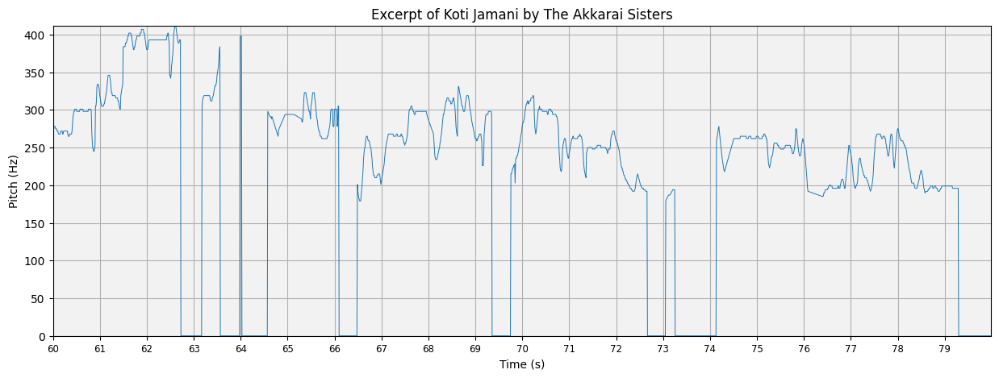

In [15]:
plot_pitch(this_pitch, this_time, title='Excerpt of Koti Jamani by The Akkarai Sisters')
ipy_audio(audio, t1, t2, sr=sr)

In [16]:
silence_mask = this_pitch==0

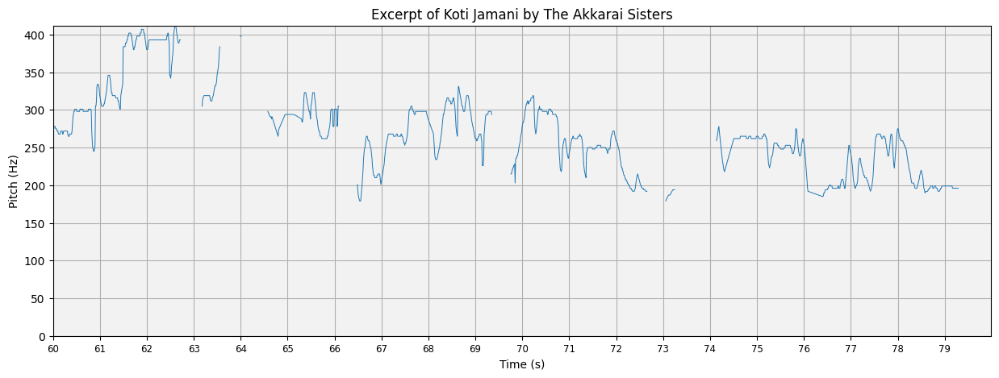

In [17]:
plot_pitch(this_pitch, this_time, mask=silence_mask, title='Excerpt of Koti Jamani by The Akkarai Sisters')
ipy_audio(audio, t1, t2, sr=sr)

In [18]:
from compiam.melody import tonic_identification

In [19]:
tonic = 195.99

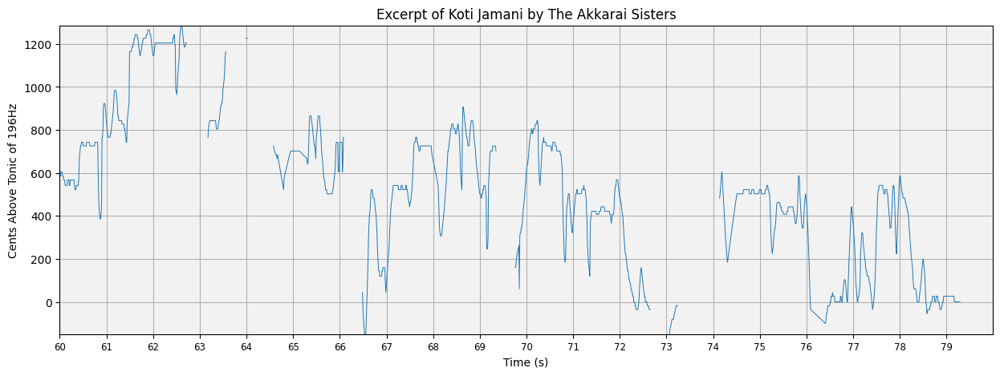

In [20]:
plot_pitch(this_pitch, this_time, mask=silence_mask, tonic=tonic, cents=True, title='Excerpt of Koti Jamani by The Akkarai Sisters')
ipy_audio(audio, t1, t2, sr=sr)

In [21]:
from compiam.utils import get_svara_pitch_carnatic

In [22]:
svara_pitch = get_svara_pitch_carnatic('ritigaula', tonic=tonic)

In [23]:
svara_pitch

{73.4133009992652: 'P',
 146.8266019985304: 'P',
 293.6532039970608: 'P',
 587.3064079941216: 'P',
 1174.6128159882435: 'P',
 65.40381575469627: 'M1',
 130.80763150939254: 'M1',
 261.6152630187851: 'M1',
 523.2305260375701: 'M1',
 1046.46105207514: 'M1',
 54.997834212038505: 'R2',
 109.99566842407701: 'R2',
 219.99133684815402: 'R2',
 439.98267369630804: 'R2',
 879.965347392616: 'R2',
 87.30361988416256: 'N2',
 174.60723976832512: 'N2',
 349.21447953665023: 'N2',
 698.4289590733005: 'N2',
 1396.857918146601: 'N2',
 58.268175617345825: 'G2',
 116.53635123469165: 'G2',
 233.0727024693833: 'G2',
 466.1454049387666: 'G2',
 932.2908098775332: 'G2',
 48.9975: 'S',
 97.995: 'S',
 195.99: 'S',
 391.98: 'S',
 783.96: 'S',
 82.40364421278775: 'D2',
 164.8072884255755: 'D2',
 329.614576851151: 'D2',
 659.229153702302: 'D2',
 1318.458307404604: 'D2'}

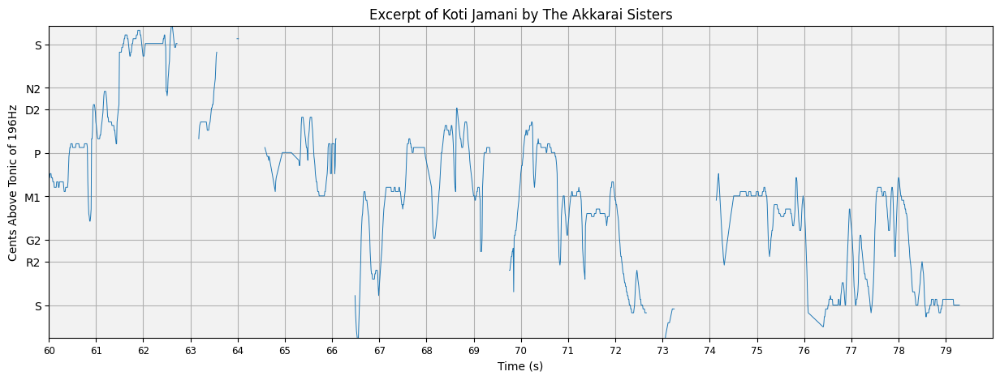

In [24]:
plot_pitch(this_pitch, this_time, mask=silence_mask, tonic=tonic, yticks_dict=svara_pitch, cents=True, title='Excerpt of Koti Jamani by The Akkarai Sisters')
ipy_audio(audio, t1, t2, sr=sr)

In [25]:
from compiam.utils.pitch import pitch_seq_to_cents

In [26]:
pitch_cents = pitch_seq_to_cents(pitch, tonic=tonic)

In [27]:
# Pattern Extraction for a Given Audio
from compiam import load_model

# Feature Extraction
# CAE features
cae = load_model("melody:cae-carnatic")

100%|██████████| 7.33M/7.33M [00:01<00:00, 4.16MiB/s]
INFO:compiam.utils.download:Download complete: /usr/local/lib/python3.11/dist-packages/compiam/models/melody/caecarnatic/caecarnatic.zip
INFO:compiam.utils.download:Extracting /usr/local/lib/python3.11/dist-packages/compiam/models/melody/caecarnatic/caecarnatic.zip...
INFO:compiam.utils.download:Extraction complete: Files extracted to /usr/local/lib/python3.11/dist-packages/compiam/models/melody/caecarnatic
INFO:compiam.utils.download:Files downloaded and extracted successfully.


/usr/local/lib/python3.11/dist-packages/compiam/models/melody/caecarnatic/carnatic/config_cqt.ini /usr/local/lib/python3.11/dist-packages/compiam/models/melody/caecarnatic/carnatic/config_spec.cfg
/usr/local/lib/python3.11/dist-packages/compiam/models/melody/caecarnatic/carnatic/config_cqt.ini /usr/local/lib/python3.11/dist-packages/compiam/models/melody/caecarnatic/carnatic/config_spec.cfg


In [28]:
ampl, _ = cae.extract_features(audio_path)
ampl

INFO:compiam.melody.pattern.sancara_search.complex_auto.cqt:loading file /content/WhatsApp Audio 2025-01-21 at 6.41.00 PM.mpeg


tensor([[0.5856, 0.7059, 0.4884,  ..., 0.2162, 0.3670, 0.3020],
        [0.5315, 0.7090, 0.4010,  ..., 0.1776, 0.3888, 0.3544],
        [0.9393, 0.4841, 0.5637,  ..., 0.1777, 0.2999, 0.2698],
        ...,
        [0.3733, 0.2373, 0.8319,  ..., 0.7802, 0.0389, 0.6745],
        [0.2085, 0.2168, 0.7695,  ..., 0.6869, 0.1170, 0.7456],
        [0.1560, 0.2846, 0.7673,  ..., 0.6201, 0.1333, 0.7193]],
       grad_fn=<PowBackward0>)

In [29]:
from compiam.melody.pattern import self_similarity

In [30]:
silence_mask = pitch==0

In [31]:
from compiam.utils.pitch import extract_stability_mask

In [32]:
stability_mask = extract_stability_mask(
    pitch=pitch_cents, # pitch track
    min_stab_sec=1.0, # minimum cummulative length of stable windows to warrant annotation
    hop_sec=0.2, # hop length in seconds
    var=60, # minimum variation from the mean in each window to be considered stable
    timestep=timestep # time in seconds between consecutice elements in <pitch>
)

/usr/local/lib/python3.11/dist-packages/compiam/utils/pitch.py:233: RuntimeWarning: Mean of empty slice
  mu = np.nanmean(seq)
/usr/local/lib/python3.11/dist-packages/compiam/utils/pitch.py:235: RuntimeWarning: All-NaN slice encountered
  maximum = np.nanmax(seq)
/usr/local/lib/python3.11/dist-packages/compiam/utils/pitch.py:236: RuntimeWarning: All-NaN slice encountered
  minimum = np.nanmin(seq)


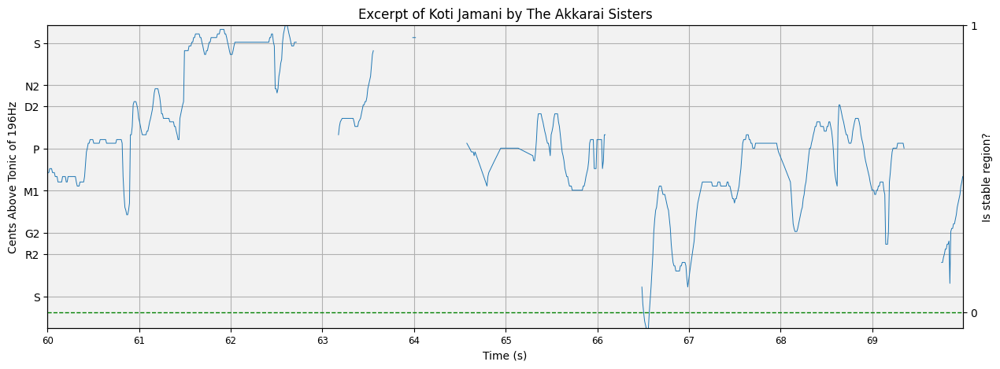

In [33]:
t1 = 60 # in seconds
t2 = t1 + 10 # in seconds

t1s = round(t1/timestep) # in sequence elements
t2s = round(t2/timestep) # in sequence elements

this_pitch = pitch[t1s:t2s]
this_time = time[t1s:t2s]
this_silence_mask = silence_mask[t1s:t2s]
this_stable_mask = stability_mask[t1s:t2s]

# get pitch plot
fig, ax = plot_pitch(this_pitch, this_time, mask=this_silence_mask, tonic=tonic, yticks_dict=svara_pitch, cents=True, title='Excerpt of Koti Jamani by The Akkarai Sisters')

# On alternative axis plot stable mask values
ax2 = ax.twinx()
ax2.plot(this_time, this_stable_mask, 'g', linewidth=1, alpha=1, linestyle='--')
ax2.set_yticks([0,1])
ax2.set_ylabel("Is stable region?")

# accompanying audio
ipy_audio(audio, t1, t2, sr=sr)

*Perfect upto this*

In [34]:
import numpy as np
exclusion_mask = np.logical_or(silence_mask==1, stability_mask==1)

In [35]:
# Mask of regions not interested in cite kaustuv, the papers that use
ss = self_similarity(
    ampl, # features
    exclusion_mask=exclusion_mask, # exclusion mask
    timestep=timestep, # time in seconds between elements of exlcusion mask
    hop_length=cae.hop_length, # window size in audio frames
    sr=cae.sr # sample rate of audio
)

# Sparsely computed self similarity matrix
X = ss[0]
# Mapping of index between theoretical full matrix and sparse one
orig_sparse_lookup = ss[1]
# Mapping of index between sparse matrix and theoretical full matrix one
sparse_orig_lookup = ss[2]
# Indices of boundaries between split regions in full matrix
boundaries_orig = ss[3]
# Indices of boundaries between split regions in sparse matrix
boundaries_sparse = ss[4]

In [36]:
import matplotlib.pyplot as plt

***Getting error in next line***

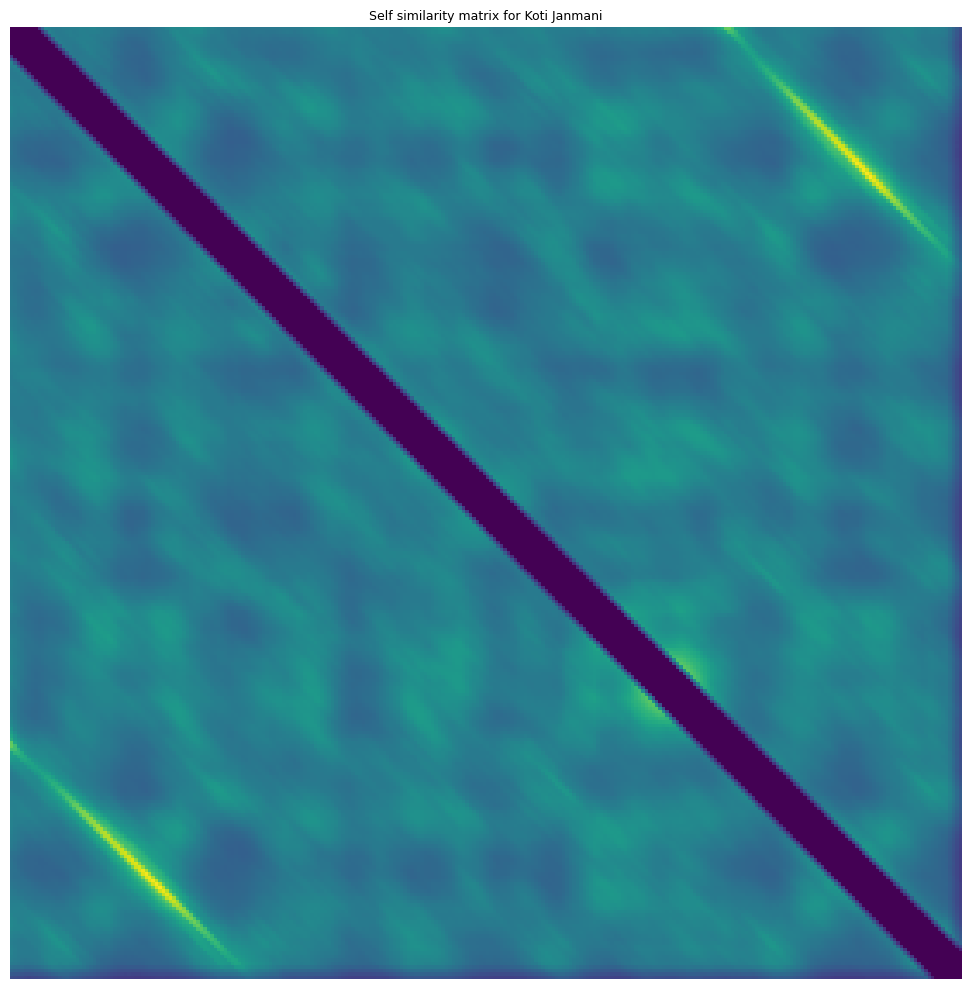

In [37]:
fig, ax = plt.subplots(figsize=(10,10))
plt.title(f'Self similarity matrix for Koti Janmani', fontsize=9)
ax.imshow(X[2000:5000,2000:5000], interpolation='nearest')
plt.axis('off')
plt.tight_layout()
plt.show()


In [38]:
from compiam.melody.pattern import segmentExtractor

In [39]:
se = segmentExtractor(
    X, # self sim matrix
    window_size=cae.hop_length, # window size
    cache_dir='.cache/' # cache directory for faster computation in future
)

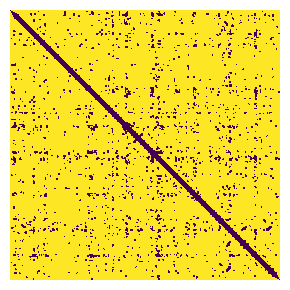

In [40]:
X_proc = se.emphasize_diagonals()
se.display_matrix(X_proc)

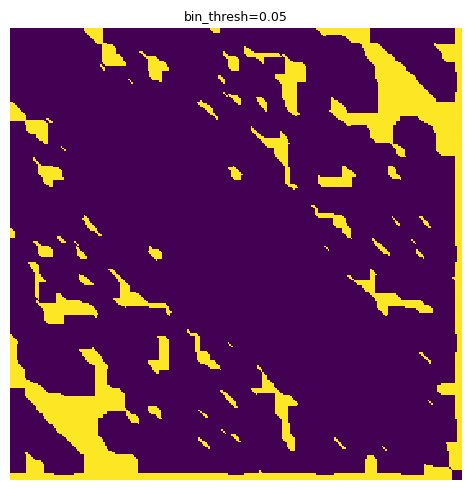

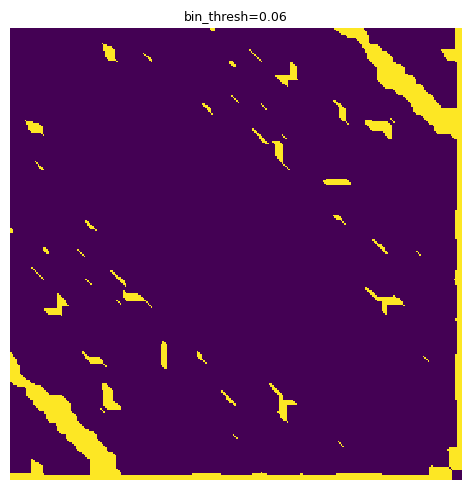

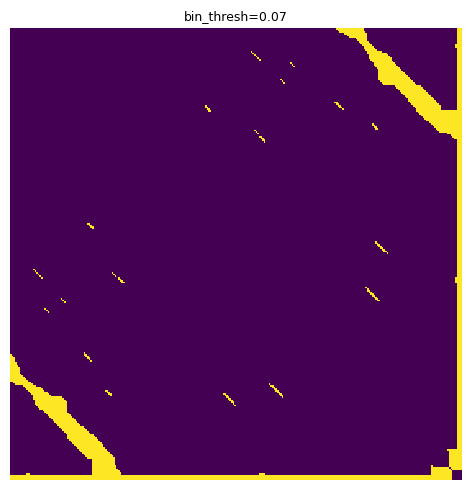

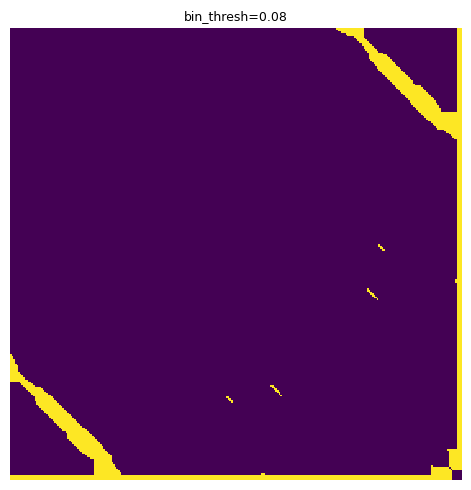

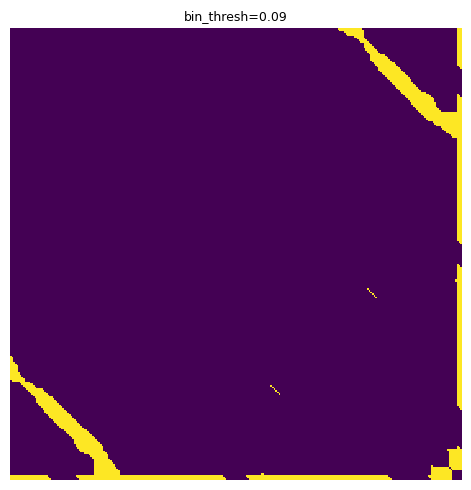

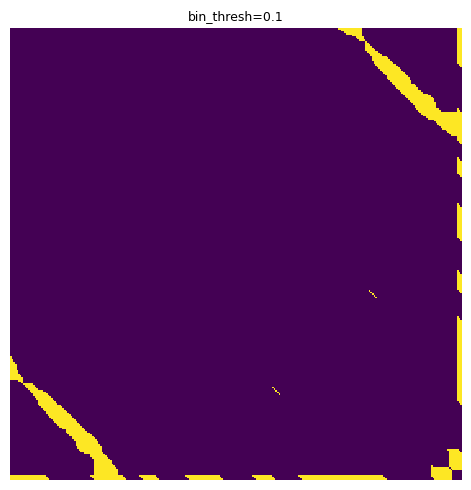

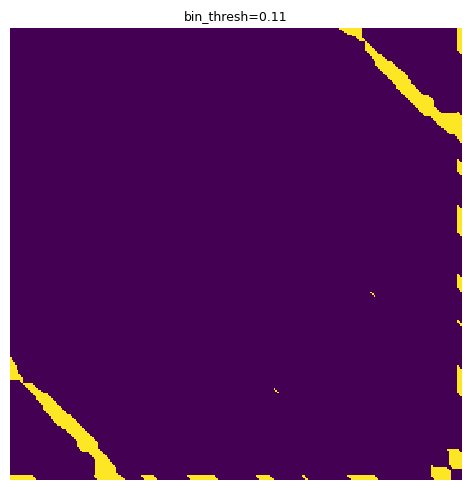

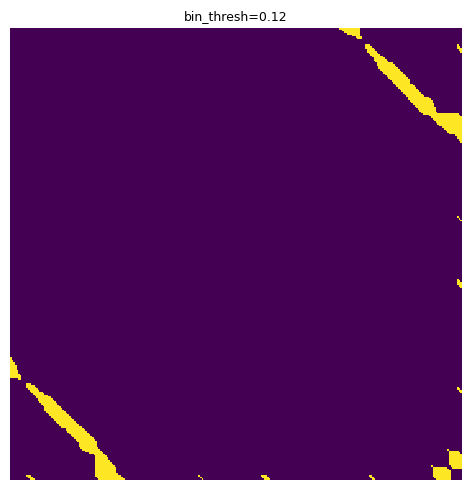

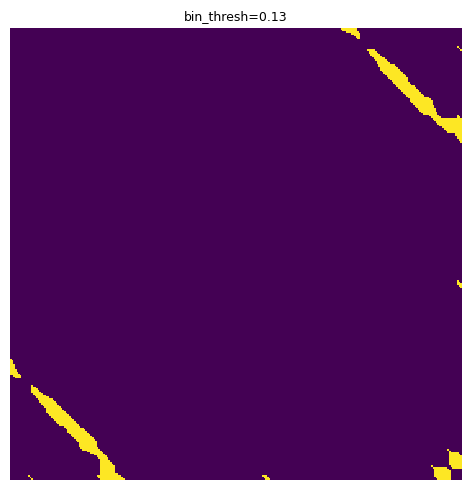

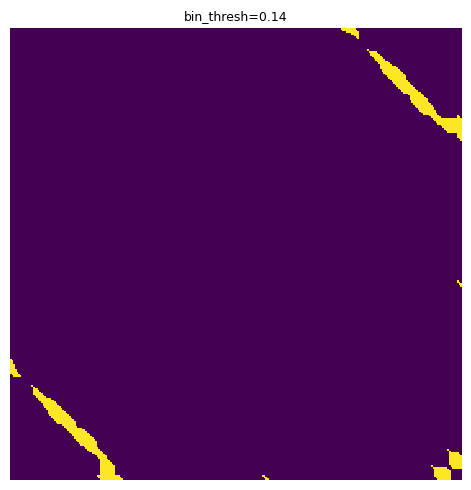

In [41]:
for i in np.arange(0.05, 0.15, 0.01):
    X_proc = se.emphasize_diagonals(bin_thresh=i)
    se.display_matrix(X_proc[2000:5000,2000:5000], title=f'bin_thresh={round(i,2)}', figsize=(5,5))

In [42]:
X_proc = se.emphasize_diagonals(bin_thresh=0.1)

In [43]:
all_segments = se.extract_segments(
    timestep=timestep, # timestep between
    boundaries=boundaries_sparse, # boundaries of sparse regions (for conversion)
    lookup=sparse_orig_lookup, # To convert between sparse and true indices
    break_mask=exclusion_mask)

100%|██████████| 1390/1390 [00:03<00:00, 394.58it/s]


In [44]:
print("Format: [(x0, y0), (x1, y1)]...")
all_segments[:10]

Format: [(x0, y0), (x1, y1)]...


[[(347, 390), (411, 453)],
 [(390, 347), (453, 411)],
 [(881, 926), (932, 978)],
 [(926, 881), (978, 931)],
 [(1221, 912), (1269, 961)],
 [(1448, 1478), (1510, 1542)],
 [(1519, 1550), (1581, 1615)],
 [(1559, 2589), (1609, 2639)],
 [(1648, 1673), (1736, 1760)],
 [(1669, 1963), (1751, 2036)]]

In [45]:
from compiam.utils import add_center_to_mask

In [46]:
exclusion_mask_center = add_center_to_mask(exclusion_mask) # center of masked regions is annotated as "2"
anchor_mask = np.array([1 if i==2 else 0 for i in exclusion_mask_center])

In [47]:
# Returns patterns in units of pitch sequence elements
starts_seq, lengths_seq = se.group_segments(
    all_segments, # segments from se.extract_segments()
    anchor_mask, # Extend patterns to these points
    pitch, # pitch track
    min_pattern_length_seconds=2, # minimum pattern length,
    thresh_dtw=None
)

INFO:compiam.melody.pattern.sancara_search.extraction.segments:...learning relationship between (sub)segments

100%|██████████| 56/56 [00:00<00:00, 429.69it/s]
INFO:compiam.melody.pattern.sancara_search.extraction.segments:...identifying matches

100%|██████████| 336/336 [00:00<00:00, 1207.65it/s]
INFO:compiam.melody.pattern.sancara_search.extraction.segments:...identifying matches

INFO:compiam.melody.pattern.sancara_search.extraction.segments:...finalising grouping

100%|██████████| 10/10 [00:00<00:00, 1534.24it/s]


In [48]:
starts_sec = [[x*timestep for x in p] for p in starts_seq]
lengths_sec = [[x*timestep for x in l] for l in lengths_seq]

In [49]:
print(f"Number of groups: {len(starts_sec)}")

Number of groups: 5


In [50]:
from compiam.visualisation.pitch import plot_subsequence
import IPython

In [51]:
# kwargs for plot_pitch
plot_kwargs = {
    'yticks_dict': svara_pitch,
    'cents':True,
    'tonic':tonic,
    'figsize':(15,4)
}

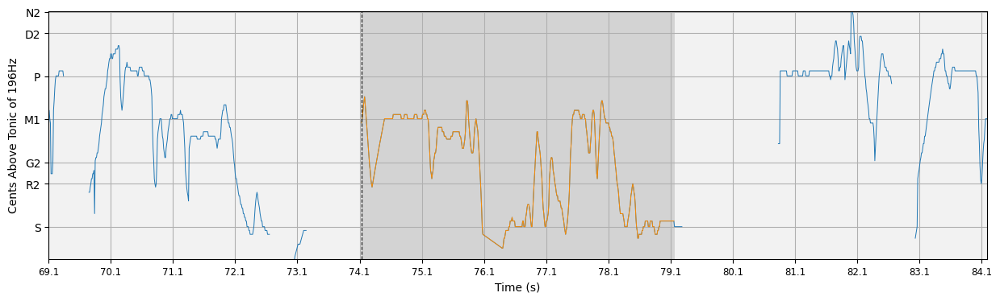

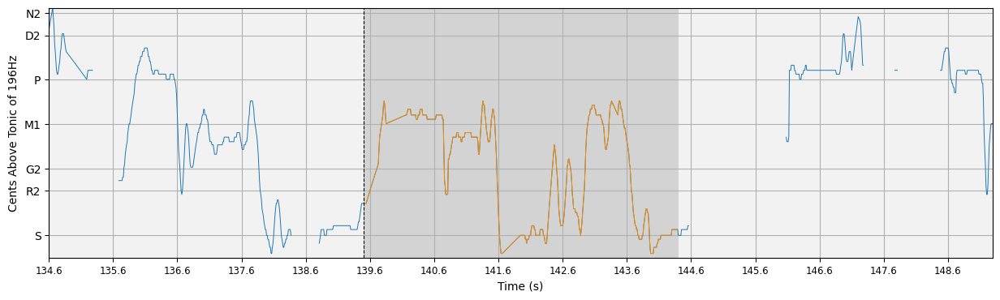

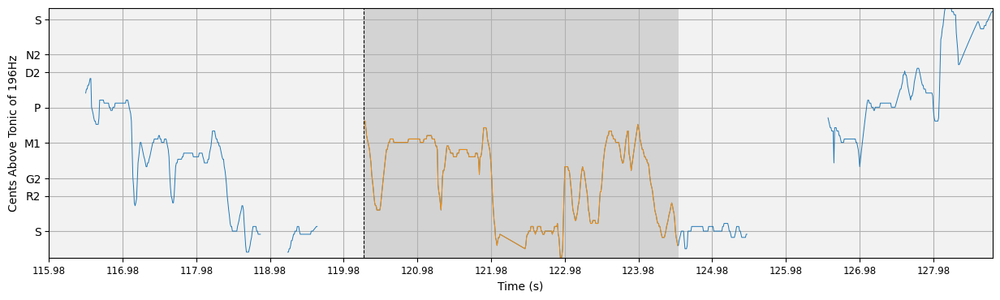

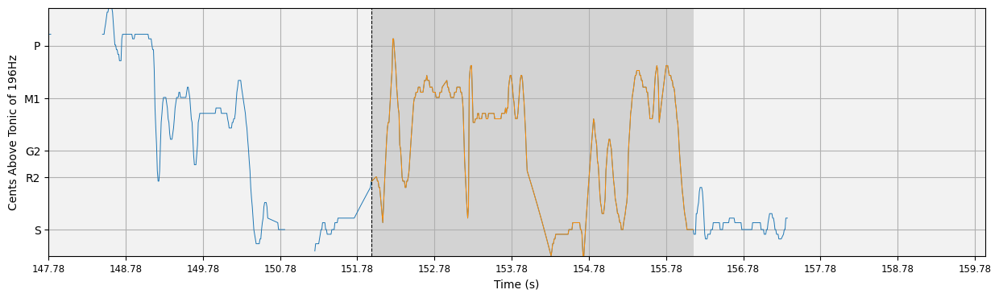

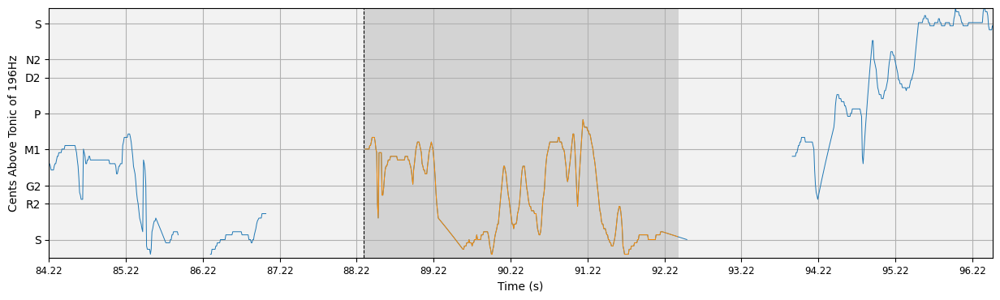

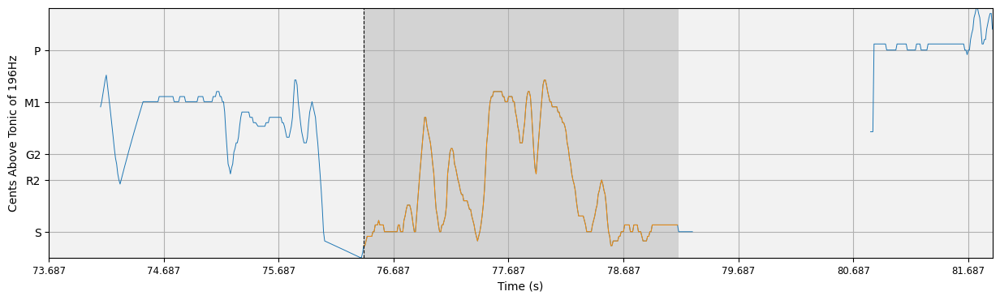

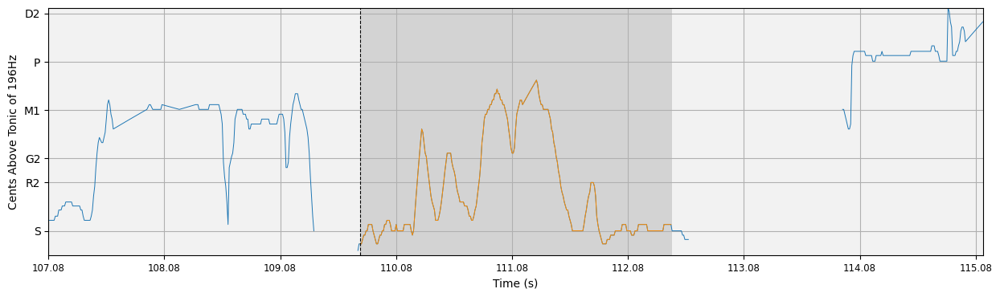

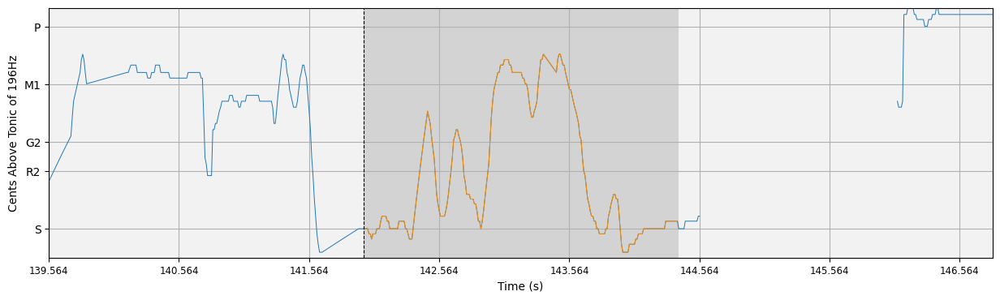

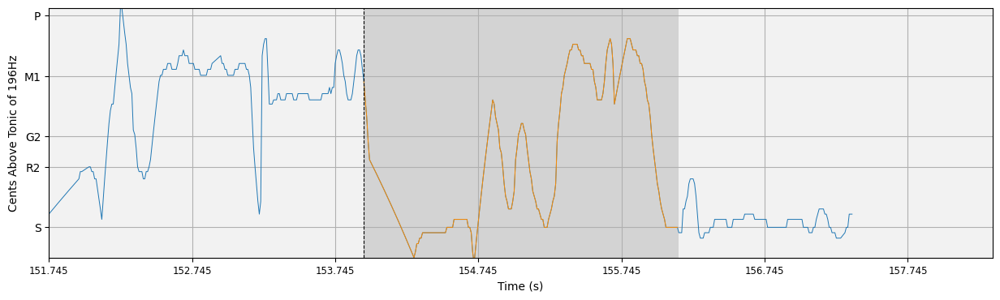

In [52]:
i = 1 # Choose pattern group

S = starts_seq[i] # get group
L = lengths_seq[i] # get lengths

for j,s in enumerate(S):
    l = L[j] # this pattern length
    ss = starts_sec[i][j] # this pattern start in seconds
    ls = lengths_sec[i][j] # this pattern length in seconds
    IPython.display.display(ipy_audio(audio, ss, ss+ls, sr=sr)) # display audio
    # display pitch plot
    plot_subsequence(s, l, pitch, time, timestep, path=None, plot_kwargs=plot_kwargs)
    plt.show()

In [53]:
pitch_segment = pitch[s : s + l] # Get pitch for the sancara
print(f"Pitch values for Sancara {i}, Instance {j}: {pitch_segment}")


Pitch values for Sancara 1, Instance 8: [259.         250.         242.         231.         223.
 221.77419355 220.5483871  219.32258065 218.09677419 216.87096774
 215.64516129 214.41935484 213.19354839 211.96774194 210.74193548
 209.51612903 208.29032258 207.06451613 205.83870968 204.61290323
 203.38709677 202.16129032 200.93548387 199.70967742 198.48387097
 197.25806452 196.03225806 194.80645161 193.58064516 192.35483871
 191.12903226 189.90322581 188.67741935 187.4516129  186.22580645
 185.         187.         190.         190.         192.
 192.         194.         194.         194.         194.
 194.         194.         194.         194.         194.
 194.         194.         194.         194.         194.
 194.         194.         194.         196.         196.
 196.         196.         196.         199.         199.
 199.         199.         199.         199.         199.
 199.         199.         199.         196.         196.
 194.         187.         183.         18

In [54]:
def prepare_dataset(starts_seq, lengths_seq, pitch):
    inputs = []
    outputs = []

    for i in range(len(starts_seq)):  # Loop through pattern groups
        S = starts_seq[i]  # Get start positions
        L = lengths_seq[i]  # Get lengths

        for j, s in enumerate(S):
            l = L[j]  # Length of the pattern
            pitch_sequence = pitch[s : s + l]  # Extract pitch sequence

            inputs.append(pitch_sequence)  # Store as input
            outputs.append(pitch_sequence)  # You can modify if needed

    return inputs, outputs


In [56]:
inputs, outputs = prepare_dataset(starts_seq, lengths_seq, pitch)


In [57]:
expected_instances = sum(len(S) for S in starts_seq)  # Count all detected patterns
actual_instances = len(inputs)

print(f"Expected Instances: {expected_instances}, Extracted Instances: {actual_instances}")


Expected Instances: 23, Extracted Instances: 23


In [59]:
import librosa
import tensorflow as tf
import numpy as np
import os

In [83]:
import tensorflow as tf

class TransformerEncoderBlock(tf.keras.layers.Layer):
    def __init__(self, embed_dim, num_heads, dff, dropout_rate=0.1):
        super(TransformerEncoderBlock, self).__init__()
        self.attention = tf.keras.layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.dense_proj = tf.keras.Sequential([
            tf.keras.layers.Dense(dff, activation="relu"),
            tf.keras.layers.Dense(embed_dim),
        ])
        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = tf.keras.layers.Dropout(dropout_rate)
        self.dropout2 = tf.keras.layers.Dropout(dropout_rate)

    def call(self, inputs, training=False):
        # Multi-head self-attention
        attn_output = self.attention(inputs, inputs, inputs)  # Query, Key, Value
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)

        # Feed-forward network
        ffn_output = self.dense_proj(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

class MusicTransformer(tf.keras.Model):
    def __init__(self, vocab_size, embed_dim, num_layers, num_heads, dff, max_sequence_length, dropout_rate=0.1):
        super(MusicTransformer, self).__init__()
        self.embedding = tf.keras.layers.Embedding(input_dim=vocab_size, output_dim=embed_dim)
        self.pos_encoding = tf.keras.layers.Embedding(input_dim=max_sequence_length, output_dim=embed_dim)
        self.encoder_blocks = [
            TransformerEncoderBlock(embed_dim, num_heads, dff, dropout_rate)
            for _ in range(num_layers)
        ]
        self.dense = tf.keras.layers.Dense(vocab_size)

    def call(self, inputs, training=False):
        seq_len = tf.shape(inputs)[1]
        positions = tf.range(start=0, limit=seq_len, delta=1)
        positions = tf.cast(positions, dtype=tf.int32)  # Ensure correct dtype for embedding lookup
        x = self.embedding(inputs) + self.pos_encoding(positions)

        for encoder_block in self.encoder_blocks:
            x = encoder_block(x, training=training)

        return self.dense(x)


In [63]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

max_length = max(len(seq) for seq in inputs)  # Get the longest sequence
print(f"Maximum Sequence Length: {max_length}")


Maximum Sequence Length: 503


In [64]:
# Pad sequences to max_length
inputs_padded = pad_sequences(inputs, maxlen=max_length, padding="post", dtype="float32")
outputs_padded = pad_sequences(outputs, maxlen=max_length, padding="post", dtype="float32")

# Convert to NumPy array
import numpy as np
inputs_padded = np.array(inputs_padded)
outputs_padded = np.array(outputs_padded)

print("Padded Inputs Shape:", inputs_padded.shape)
print("Padded Outputs Shape:", outputs_padded.shape)


Padded Inputs Shape: (23, 503)
Padded Outputs Shape: (23, 503)


In [71]:
import tensorflow as tf

# Define fixed sequence length
fixed_length = 503  # Make all sequences 503 elements long

# Pad inputs and outputs to length 503
inputs_padded = tf.keras.preprocessing.sequence.pad_sequences(
    inputs, maxlen=fixed_length, padding="post", dtype="float32"
)
outputs_padded = tf.keras.preprocessing.sequence.pad_sequences(
    outputs, maxlen=fixed_length, padding="post", dtype="float32"
)

print("Padded Inputs Shape:", inputs_padded.shape)  # Expected: (22, 503)
print("Padded Outputs Shape:", outputs_padded.shape)  # Expected: (22, 503)


Padded Inputs Shape: (23, 503)
Padded Outputs Shape: (23, 503)


In [75]:
import numpy as np
import tensorflow as tf

# Define fixed sequence length
fixed_length = 503  # Maximum length

# Pad inputs and outputs
inputs_padded = tf.keras.preprocessing.sequence.pad_sequences(
    inputs, maxlen=fixed_length, padding="post", dtype="float32"
)
outputs_padded = tf.keras.preprocessing.sequence.pad_sequences(
    outputs, maxlen=fixed_length, padding="post", dtype="float32"
)

# Check the shapes
for i, (x, y) in enumerate(zip(inputs_padded, outputs_padded)):
    print(f"Sample {i}: X shape = {x.shape}, Y shape = {y.shape}")

print("Final Padded Inputs Shape:", inputs_padded.shape)  # Should be (22, 503)
print("Final Padded Outputs Shape:", outputs_padded.shape)  # Should be (22, 503)


Sample 0: X shape = (503,), Y shape = (503,)
Sample 1: X shape = (503,), Y shape = (503,)
Sample 2: X shape = (503,), Y shape = (503,)
Sample 3: X shape = (503,), Y shape = (503,)
Sample 4: X shape = (503,), Y shape = (503,)
Sample 5: X shape = (503,), Y shape = (503,)
Sample 6: X shape = (503,), Y shape = (503,)
Sample 7: X shape = (503,), Y shape = (503,)
Sample 8: X shape = (503,), Y shape = (503,)
Sample 9: X shape = (503,), Y shape = (503,)
Sample 10: X shape = (503,), Y shape = (503,)
Sample 11: X shape = (503,), Y shape = (503,)
Sample 12: X shape = (503,), Y shape = (503,)
Sample 13: X shape = (503,), Y shape = (503,)
Sample 14: X shape = (503,), Y shape = (503,)
Sample 15: X shape = (503,), Y shape = (503,)
Sample 16: X shape = (503,), Y shape = (503,)
Sample 17: X shape = (503,), Y shape = (503,)
Sample 18: X shape = (503,), Y shape = (503,)
Sample 19: X shape = (503,), Y shape = (503,)
Sample 20: X shape = (503,), Y shape = (503,)
Sample 21: X shape = (503,), Y shape = (503,

In [98]:
# Define model parameters
vocab_size = 505
embed_dim = 128
num_layers = 2
num_heads = 4
dff = 512
dropout_rate = 0.1
max_sequence_length = inputs_padded.shape[1]  # Ensure this matches your data

# Initialize the model
model = MusicTransformer(
    vocab_size=vocab_size,
    embed_dim=embed_dim,
    num_layers=num_layers,
    num_heads=num_heads,
    dff=dff,
    max_sequence_length=503,  # ✅ Added this parameter
    dropout_rate=dropout_rate,
)

# Compile the model
model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

# Train the model
history = model.fit(inputs_padded, outputs_padded, epochs=20, batch_size=16)


Epoch 1/20
2/2 [==============================] - 11s 2s/step - loss: 12.5817 - accuracy: 0.1190
Epoch 2/20
2/2 [==============================] - 5s 1s/step - loss: 6.8376 - accuracy: 0.4279
Epoch 3/20
2/2 [==============================] - 4s 1s/step - loss: 5.3773 - accuracy: 0.4290
Epoch 4/20
2/2 [==============================] - 4s 1s/step - loss: 4.6469 - accuracy: 0.4306
Epoch 5/20
2/2 [==============================] - 6s 1s/step - loss: 4.2186 - accuracy: 0.4324
Epoch 6/20
2/2 [==============================] - 4s 1s/step - loss: 3.8539 - accuracy: 0.4308
Epoch 7/20
2/2 [==============================] - 4s 1s/step - loss: 3.5224 - accuracy: 0.4286
Epoch 8/20
2/2 [==============================] - 6s 1s/step - loss: 3.1923 - accuracy: 0.4278
Epoch 9/20
2/2 [==============================] - 4s 1s/step - loss: 2.7666 - accuracy: 0.4278
Epoch 10/20
2/2 [==============================] - 4s 1s/step - loss: 2.4443 - accuracy: 0.4278
Epoch 11/20
2/2 [==============================

In [99]:
import numpy as np
import tensorflow as tf

def generate_sancara(model, initial_sequence, max_length=50, temperature=1.2):
    """Generate a new sancara using the trained model."""

    # Convert initial_sequence to a numpy array and ensure correct shape
    sequence = np.array(initial_sequence).reshape(1, -1)  # Shape: (1, sequence_length)
    generated = list(initial_sequence)  # Store generated sequence

    for _ in range(max_length):
        # Get model prediction (logits)
        prediction = model.predict(sequence, verbose=0)  # Shape: (1, sequence_length, vocab_size)

        # Apply temperature scaling
        logits = prediction[:, -1, :] / temperature
        prediction_probs = tf.nn.softmax(logits, axis=-1).numpy()  # Convert to probabilities

        # Sample from the probability distribution
        next_pitch = np.random.choice(np.arange(prediction_probs.shape[-1]), p=prediction_probs[0])
        next_pitch = np.clip(next_pitch, 0, 250)
        # Append the predicted pitch
        generated.append(next_pitch)

        # Update the input sequence for the next iteration (sliding window approach)
        sequence = np.array(generated[-len(initial_sequence):]).reshape(1, -1)  # Keep sequence length fixed

    return generated

# Example: Generate a new sancara using a random starting sequence
initial_sequence = inputs[0]  # Start with the first pitch sequence
generated_sancara = generate_sancara(model, initial_sequence, max_length=50, temperature=1.2)

print("Generated Sancara:", generated_sancara[len(initial_sequence):])  # Exclude initial sequence


Generated Sancara: [250, 174, 141, 0, 250, 0, 250, 228, 250, 0, 250, 13, 235, 0, 250, 250, 150, 250, 0, 31, 0, 0, 183, 250, 83, 239, 47, 0, 250, 250, 43, 250, 0, 0, 40, 23, 250, 250, 0, 250, 0, 0, 0, 39, 201, 228, 207, 0, 0, 250]


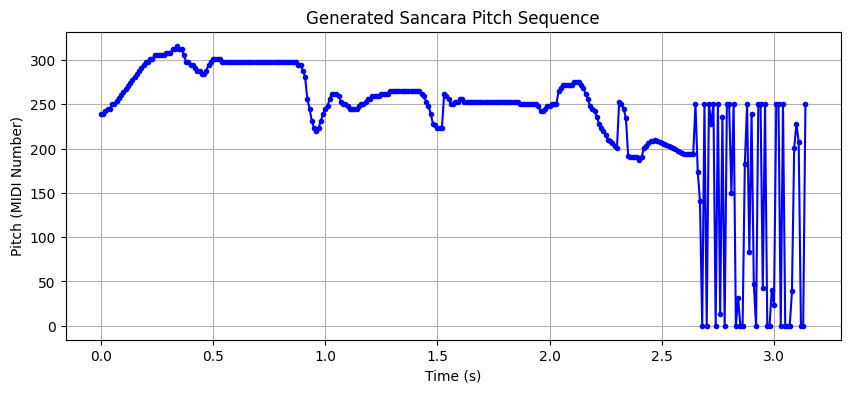

In [100]:
import matplotlib.pyplot as plt
import numpy as np

def plot_generated_sancara(generated_sancara, timestep=0.01):
    """
    Plots the generated sancara pitch sequence.

    Parameters:
    - generated_sancara: List or array of pitch values
    - timestep: Time interval between each pitch (default: 0.01s)
    """
    time_axis = np.arange(len(generated_sancara)) * timestep  # Create time axis

    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, generated_sancara, marker='o', linestyle='-', color='b', markersize=3)
    plt.xlabel("Time (s)")
    plt.ylabel("Pitch (MIDI Number)")
    plt.title("Generated Sancara Pitch Sequence")
    plt.grid(True)
    plt.show()

# Call the function to plot the pitch sequence
plot_generated_sancara(generated_sancara)


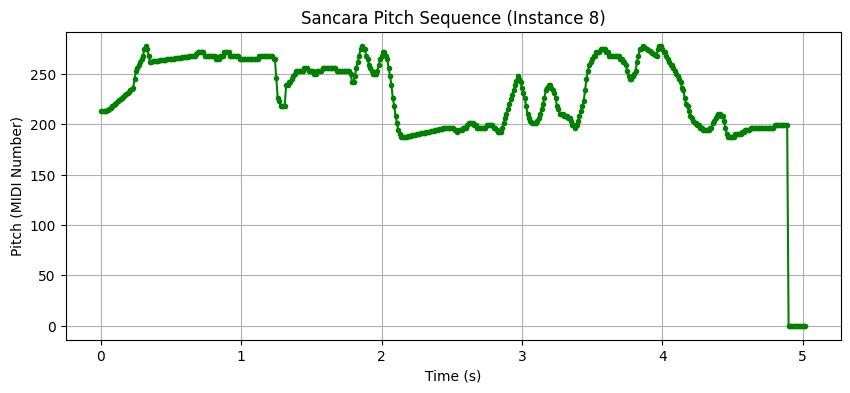

In [95]:
import matplotlib.pyplot as plt
import numpy as np

def plot_sancara_instance(inputs_padded, instance_idx, timestep=0.01):
    """
    Plots the pitch sequence for a specific instance from the dataset.

    Parameters:
    - inputs_padded: Array of pitch sequences (shape: num_samples x sequence_length)
    - instance_idx: Index of the instance to plot
    - timestep: Time interval between each pitch (default: 0.01s)
    """
    instance = inputs_padded[instance_idx]  # Extract the specific instance
    time_axis = np.arange(len(instance)) * timestep  # Create time axis

    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, instance, marker='o', linestyle='-', color='g', markersize=3)
    plt.xlabel("Time (s)")
    plt.ylabel("Pitch (MIDI Number)")
    plt.title(f"Sancara Pitch Sequence (Instance {instance_idx})")
    plt.grid(True)
    plt.show()

# Example: Plot instance 5
plot_sancara_instance(inputs_padded, instance_idx=8)
